<a href="https://colab.research.google.com/github/MA717/Cap-Order-website-/blob/main/DRISE_ObjectDetection.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [2]:
!git clone https://github.com/ultralytics/yolov3  # clone
!pip install -r yolov3/requirements.txt  # install
!pip install ultralytics


fatal: destination path 'yolov3' already exists and is not an empty directory.


In [ ]:
from google.colab import drive
drive.mount('/content/drive')

In [3]:
from ultralytics import YOLO

# Load the model

label_names = [
    'person',
    'bicycle',
    'car',
    'motorcycle',
    'airplane',
    'bus',
    'train',
    'truck',
    'boat',
    'traffic light',
    'fire hydrant',
    'stop sign',
    'parking meter',
    'bench',
    'bird',
    'cat',
    'dog',
    'horse',
    'sheep',
    'cow',
    'elephant',
    'bear',
    'zebra',
    'giraffe',
    'backpack',
    'umbrella',
    'handbag',
    'tie',
    'suitcase',
    'frisbee',
    'skis',
    'snowboard',
    'sports ball',
    'kite',
    'baseball bat',
    'baseball glove',
    'skateboard',
    'surfboard',
    'tennis racket',
    'bottle',
    'wine glass',
    'cup',
    'fork',
    'knife',
    'spoon',
    'bowl',
    'banana',
    'apple',
    'sandwich',
    'orange',
    'broccoli',
    'carrot',
    'hot dog',
    'pizza',
    'donut',
    'cake',
    'chair',
    'couch',
    'potted plant',
    'bed',
    'dining table',
    'toilet',
    'tv',
    'laptop',
    'mouse',
    'remote',
    'keyboard',
    'cell phone',
    'microwave',
    'oven',
    'toaster',
    'sink',
    'refrigerator',
    'book',
    'clock',
    'vase',
    'scissors',
    'teddy bear',
    'hair drier',
    'toothbrush',
]

In [4]:

def createYoloModels():
  modelYoloCLS = YOLO('yolov8n-cls.pt')
  modelYoloV3 = YOLO('yolov3.pt')  # load a pretrained model
  model = YOLO("yolov8s.pt")  # load a pretrained model (recommended for training)
  # model.train(data='VOC1.yaml', epochs=100, imgsz=640)
  # Use the model
  return model, modelYoloV3 , modelYoloCLS



def testYolomodelsOnpredictions(image):
  results = model(image)  # predict on an image
  resultsCls = modelYoloCLS(image)


  for i , result in enumerate(results):
    print(str(i), result.boxes.data)


  for i , result in enumerate(resultsCls):
    print(str(i), result.names)
    print(str(i), result.probs)


model , modelYoloV3 ,modelYoloCLS = createYoloModels()



PRO TIP 💡 Replace 'model=yolov3.pt' with new 'model=yolov3u.pt'.
YOLOv5 'u' models are trained with https://github.com/ultralytics/ultralytics and feature improved performance vs standard YOLOv5 models trained with https://github.com/ultralytics/yolov5.



In [5]:
testYolomodelsOnpredictions('000029.jpg')


image 1/1 /content/000029.jpg: 448x640 1 dog, 194.3ms
Speed: 3.0ms preprocess, 194.3ms inference, 1.6ms postprocess per image at shape (1, 3, 448, 640)

image 1/1 /content/000029.jpg: 224x224 Saluki 0.21, Italian_greyhound 0.16, whippet 0.10, Great_Dane 0.07, Walker_hound 0.07, 13.1ms
Speed: 1.0ms preprocess, 13.1ms inference, 0.1ms postprocess per image at shape (1, 3, 224, 224)


0 tensor([[ 53.9274,  64.3777, 282.7889, 288.4047,   0.9534,  16.0000]])
0 {0: 'tench', 1: 'goldfish', 2: 'great_white_shark', 3: 'tiger_shark', 4: 'hammerhead', 5: 'electric_ray', 6: 'stingray', 7: 'cock', 8: 'hen', 9: 'ostrich', 10: 'brambling', 11: 'goldfinch', 12: 'house_finch', 13: 'junco', 14: 'indigo_bunting', 15: 'robin', 16: 'bulbul', 17: 'jay', 18: 'magpie', 19: 'chickadee', 20: 'water_ouzel', 21: 'kite', 22: 'bald_eagle', 23: 'vulture', 24: 'great_grey_owl', 25: 'European_fire_salamander', 26: 'common_newt', 27: 'eft', 28: 'spotted_salamander', 29: 'axolotl', 30: 'bullfrog', 31: 'tree_frog', 32: 'tailed_frog', 33: 'loggerhead', 34: 'leatherback_turtle', 35: 'mud_turtle', 36: 'terrapin', 37: 'box_turtle', 38: 'banded_gecko', 39: 'common_iguana', 40: 'American_chameleon', 41: 'whiptail', 42: 'agama', 43: 'frilled_lizard', 44: 'alligator_lizard', 45: 'Gila_monster', 46: 'green_lizard', 47: 'African_chameleon', 48: 'Komodo_dragon', 49: 'African_crocodile', 50: 'American_alligato

In [6]:

import torch
import matplotlib.pyplot as plt
import numpy as np
import cv2
from ultralytics import YOLO
import pdb

def testModelResult ( imageFileName):
  image = cv2.imread( imageFileName )
  scale = 640 / min(image.shape[:2])
  image = cv2.resize(image,
                    (640,640),
                    interpolation=cv2.INTER_CUBIC)


  results = modelYoloV3(image)    # Load the model

  resultsProbs = modelYoloCLS(image)  # Perform inference

  for result in results:
    boxes = result.boxes

  boxes = boxes.data
  boxes = boxes.cpu().detach().numpy()


  targetImage = image.copy()

  for i, pred in enumerate(boxes):
          print(pred)
          box= pred[0:4]
          score = pred[4]

          if score < 0.5:
              break
          box = tuple(np.round(box).astype(int).tolist())
          print(i, label_names[pred[5].astype(int)], box, score)
          cv2.rectangle(targetImage, box[:2], box[2:], (0, 255, 0), 5)

  plt.figure(figsize=(7, 7))
  plt.imshow(targetImage[:, :, ::-1])
  plt.show()
  return image






In [ ]:
if torch.cuda.is_available():
    device = torch.device("cuda")
    print(f"Pytorch version: {torch.__version__}")
    print(f"Device name: {torch.cuda.get_device_name(0)}")
else:
    device = torch.device("cpu")
    print("No GPU available.")

In [7]:
import math
import pdb
def generateMasks(imageSize, gridSize, probThresh , numOfMasks):
  masksList= []
  for i in range(numOfMasks):
    imageWidth, imageHeight = imageSize
    gridWidth, gridHeight = gridSize
    cellWidth, cellHeight = math.ceil(imageWidth / gridWidth), math.ceil(imageHeight / gridHeight)

    upWidth, upHeight = (gridWidth + 1) * cellWidth, (gridHeight + 1) * cellHeight

    mask = (np.random.uniform(0, 1, size=(gridHeight, gridWidth)) < probThresh).astype(np.float32)

    mask = cv2.resize(mask, (upWidth, upHeight), interpolation=cv2.INTER_LINEAR)

    randomOffsetWidth = np.random.randint(0, cellWidth)
    randomOffsetHeight = np.random.randint(0, cellHeight)
    mask = mask[randomOffsetHeight:randomOffsetHeight + imageHeight, randomOffsetWidth:randomOffsetWidth +imageWidth]
    masksList.append(mask)
  return masksList



def maskImage ( image , numOfMasks = 500 , imageSize =(416,416) , gridSize=(16,16), probThresh = 0.5 ):
  masks1D = generateMasks ( imageSize , gridSize ,probThresh,numOfMasks )
  # Convert the list of masks to a numpy array and expand it
  masks = np.array(masks1D)
  masks =  np.expand_dims(masks, axis=-1)
  # Create a new mask by repeating the expanded masks along the last axis (axis=-1)
  masks = np.repeat(masks, repeats=3, axis=-1)
  maskedImage = ((image.astype(np.float32)/255 * masks ) )
  maskedImage =  np.transpose(maskedImage, (0, 3, 1, 2)) # adjust the size to pe fed to the model

  return maskedImage , masks1D


0: 640x640 1 dog, 1593.2ms
Speed: 1.8ms preprocess, 1593.2ms inference, 1.3ms postprocess per image at shape (1, 3, 640, 640)

0: 224x224 Italian_greyhound 0.21, Saluki 0.17, whippet 0.10, pug 0.05, Chihuahua 0.05, 12.6ms
Speed: 1.5ms preprocess, 12.6ms inference, 0.1ms postprocess per image at shape (1, 3, 224, 224)


[     69.481       118.6      361.68      558.26     0.95541          16]
0 dog (69, 119, 362, 558) 0.9554068


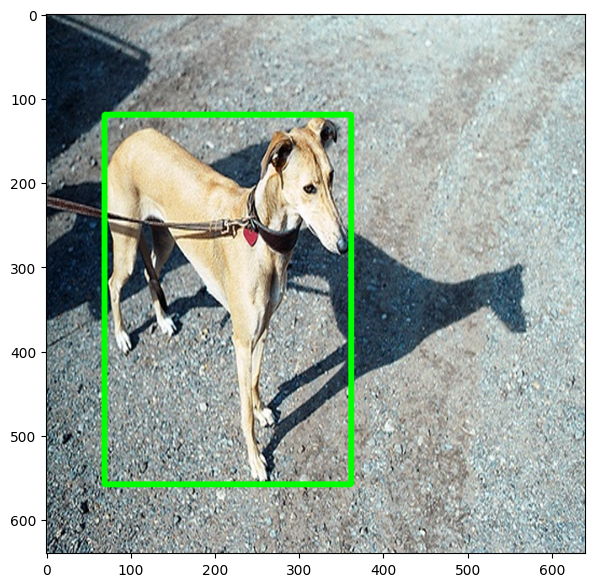


0: 640x640 (no detections), 1: 640x640 1 apple, 2: 640x640 (no detections), 3: 640x640 (no detections), 4: 640x640 (no detections), 5: 640x640 (no detections), 6: 640x640 (no detections), 7: 640x640 (no detections), 8: 640x640 (no detections), 9: 640x640 1 horse, 10: 640x640 (no detections), 11: 640x640 (no detections), 12: 640x640 1 horse, 13: 640x640 (no detections), 14: 640x640 1 bench, 15: 640x640 (no detections), 16: 640x640 (no detections), 17: 640x640 1 sheep, 18: 640x640 (no detections), 19: 640x640 2 horses, 20: 640x640 (no detections), 21: 640x640 1 teddy bear, 22: 640x640 1 dog, 23: 640x640 1 cow, 24: 640x640 2 teddy bears, 25: 640x640 1 traffic light, 26: 640x640 (no detections), 27: 640x640 (no detections), 28: 640x640 (no detections), 29: 640x640 (no detections), 30: 640x640 1 horse, 31: 640x640 (no detections), 32: 640x640 1 horse, 33: 640x640 1 horse, 34: 640x640 2 horses, 35: 640x640 1 bird, 36: 640x640 (no detections), 37: 640x640 (no detections), 38: 640x640 1 cow, 

[     537.56     0.15804      622.79      54.173     0.39425          47]
[     33.681      111.75      363.08      627.92     0.32046          17]
[     18.306      126.77      352.91      579.91     0.25999          17]
[     1.3418      84.234      637.53      637.23     0.34094          13]
[     63.581      121.57       357.2      426.68     0.34882          18]
[     66.415      125.24      358.87      386.04     0.54276          17]
horse (66, 125, 359, 386) 0.54276115
[      3.238      54.055       637.9      637.02     0.29885          17]
[     1.2458     0.94949      336.51      462.13     0.54451          77]
teddy bear (1, 1, 337, 462) 0.5445127
[     94.787      118.86      361.74      446.44     0.38244          16]
[     0.8371      106.38      635.81      624.99     0.33112          19]
[     55.927      121.17      373.19      449.17     0.43397          77]
[     66.802      134.65      230.97      365.53     0.31128           9]
[     45.685      119.61      362.07 

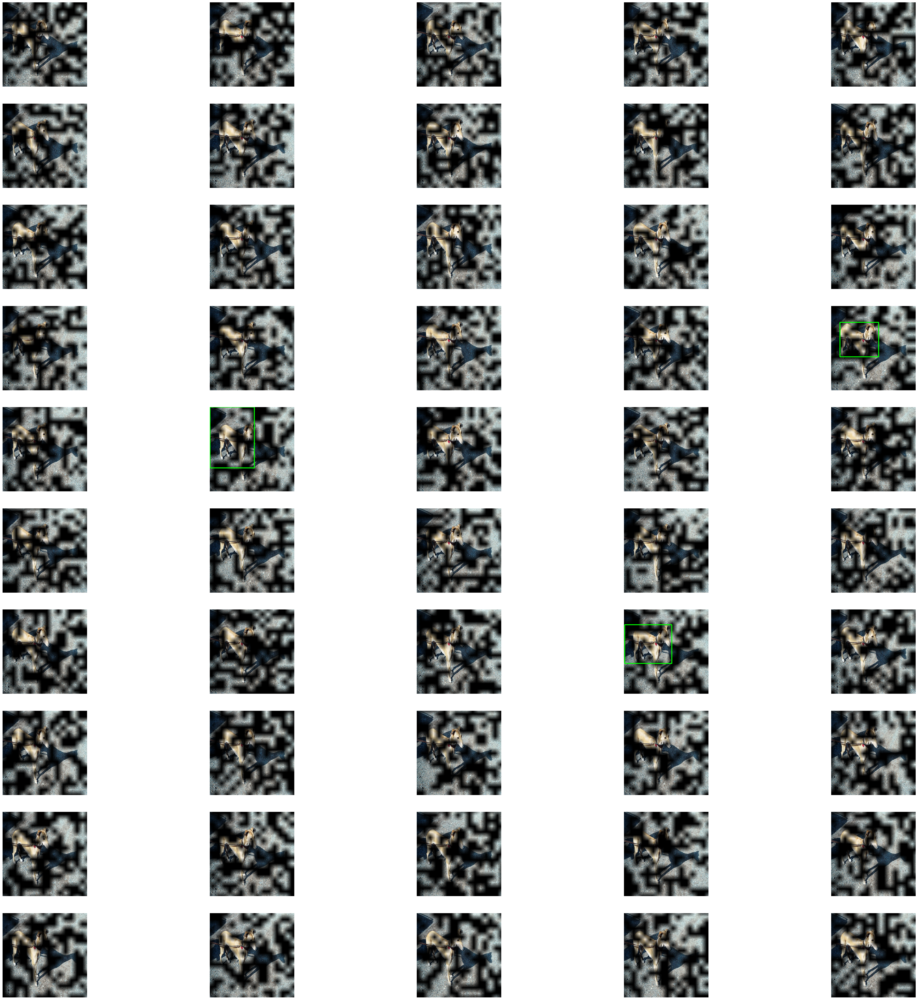

In [8]:
def testMaskGeneration(image ,numOfMasks = 32) :
  imageHeight, imageWidth = image.shape[:2]

  images = []
  maskedImages,masks = maskImage(image,
                          numOfMasks = numOfMasks,
                          imageSize=(imageWidth, imageHeight),
                          gridSize=(16,16),
                          probThresh=0.5)
  results = model(torch.from_numpy(maskedImages))

  for i , result in enumerate(results):
        boxes = result.boxes
        boxes = boxes.data
        boxes = boxes.cpu().detach().numpy()
        res = maskedImages[i]
        res = np.transpose(res,(1,2,0))
        for pred in boxes:
            print(pred)
            box= pred[0:4]
            score = pred[4]
                # print(box ,score )
            if score < 0.5:
                break
            box = tuple(np.round(box).astype(int).tolist())
            print(label_names[pred[5].astype(int)], box, score)
            cv2.rectangle(res, box[:2], box[2:], (0, 255, 0), 5)
        images.append(res)

  fig = plt.figure(figsize=(50, 50))
  axes = fig.subplots(10, 5)
  for i in range(10):
      for j in range(5):
        axes[i][j].imshow(images[i * 5 + j][:, :, ::-1])
        axes[i][j].axis('off')

  plt.show()




image = testModelResult('000029.jpg')
testMaskGeneration(image ,50 )


In [9]:
def iou(box1, box2):
    topLeft = np.maximum(box1[:2], box2[:2])
    bottomRight = np.minimum(box1[2:], box2[2:])
    inter = np.prod(bottomRight - topLeft) * (topLeft < bottomRight).all()
    area1 = np.prod(box1[2:] - box1[:2])
    area2 = np.prod(box2[2:] - box2[:2])
    return inter/ (area1 + area2 - inter)


In [ ]:
def iou_batch(bbox1, bboxes2):
    bbox1 = np.asarray(bbox1)
    bboxes2 = np.asarray(bboxes2)
    x11, y11, x12, y12 = bbox1
    x21, y21, x22, y22 = np.split(bboxes2, 4, axis=1)
    xA = np.maximum(x11, np.transpose(x21))
    yA = np.maximum(y11, np.transpose(y21))
    xB = np.minimum(x12, np.transpose(x22))
    yB = np.minimum(y12, np.transpose(y22))
    interArea = np.maximum((xB - xA + 1), 0) * np.maximum((yB - yA + 1), 0)
    boxAArea = (x12 - x11 + 1) * (y12 - y11 + 1)
    boxBArea = (x22 - x21 + 1) * (y22 - y21 + 1)
    iou = interArea / (boxAArea + np.transpose(boxBArea) - interArea)
    return iou

In [10]:
def getClassProbs(image ):

 results = modelYoloCLS(image)
 classprobs = []
 for res in results:
    classprobs.append(res.probs.data)

 return classprobs


def getBoundingBoxDimension(results):
  boundingBox = results[0:4]
  return boundingBox

def getObjectScoreness(results):
  objectScore = results[4]
  return objectScore


def getYoloResultData( results):
  modelPredicitonResults = []
  for result in results:
     modelPredicitonResults.append(result.boxes.data.cpu().detach().numpy())
  return modelPredicitonResults


def calculateCosineSimilarity(target , mask ):
 vec1 = getClassProbs(target)
 vec2 = getClassProbs(mask)
 cosSim = torch.dot(vec1[0] , vec2[0] ) /( torch.norm(vec1[0]) *  torch.norm(vec2[0]))
 return cosSim.item()



def calculateMaxScore ( predictions , target_box, image,maskImage):
 ResultIou =[0]
 for pred in predictions :
  box = pred[0:4]
  score = pred[4]

  cosSim = calculateCosineSimilarity(image , np.transpose(maskImage,(1,2,0)) )
  ResultIou.append( iou(target_box, box).squeeze() * score *cosSim  )
 print("Result IOu shape " )
 print(ResultIou)
 return max(ResultIou )


In [13]:
import pdb
def generate_saliency_map(image,
                          targetBox,
                          probThresh=0.5,
                          gridSize=(16, 16),
                          numMasks=500,
                          ):

    imageHeight, imageWidth = image.shape[:2]
    res = np.zeros((imageHeight, imageWidth), dtype=np.float32)


    maskedImages, mask = maskImage ( image , numMasks  ,
                                 imageSize =(imageHeight,imageWidth) ,
                                  gridSize=(16,16), probThresh = 0.5 )


    results = model(torch.from_numpy(maskedImages))

    predicts = getYoloResultData(results)

    ResultIou= [0]
    for i , pred in enumerate(predicts):
      score = calculateMaxScore(pred,targetBox,image, maskedImages[i] )
      print ("score res ",  score )
      res += mask[i] * score
      print ( "res of masks * score " , res )


    return res

In [ ]:

import numpy as np



targetBox  = np.array((69, 119, 362, 558) )

traget_class =2
print('Target Box :',targetBox)
map = generate_saliency_map(image,
                                     targetBox=targetBox,
                                     probThresh=0.5,
                                     gridSize=(16, 16),
                                     numMasks=1000)

image_with_bbox = image.copy()

cv2.rectangle(image_with_bbox, tuple(targetBox[:2]), tuple(targetBox[2:]),
              (0, 255, 0), 5)
plt.figure(figsize=(10, 10))
plt.imshow(image_with_bbox)
plt.imshow(map, cmap='jet', alpha=0.5)
plt.show()